In [1]:
import os
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ["CUDA_VISIBLE_DEVICES"] = "0" 

import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

In [2]:
path = os.path.abspath('..')
path

'/home/upadesh/3_Codes/1_Conv_LSTM/0_Micro-Interface-ConvLSTM'

# Model Architecture 1 Predictions

In [3]:
X_test_M1 = np.load(path+'/Step_1_train_test_data/X_y_feature_label/model_1/X_test_M1.npy')
y_test_M1 = np.load (path+'/Step_1_train_test_data/X_y_feature_label/model_1/y_test_M1.npy')

X_test_M1.shape, y_test_M1.shape

((363, 19, 64, 64, 1), (363, 19, 64, 64, 1))

In [20]:
model_1 = load_model(path+'/Step_2_model_development/model_1/trained_model_1.h5')
history_1 = np.load(path+'/Step_2_model_development/model_1/trained_model_1_history.npy', allow_pickle=True).item()

In [22]:
model_1.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, 64, 64, 1)  0         
                             ]                                   
                                                                 
 conv_lstm2d (ConvLSTM2D)    (None, None, 64, 64, 64)  416256    
                                                                 
 batch_normalization (BatchN  (None, None, 64, 64, 64)  256      
 ormalization)                                                   
                                                                 
 conv_lstm2d_1 (ConvLSTM2D)  (None, None, 64, 64, 64)  295168    
                                                                 
 batch_normalization_1 (Batc  (None, None, 64, 64, 64)  256      
 hNormalization)                                                 
                                                             

### GEN-0 Prediction

In [23]:
GT_array = y_test_M1
a, b, c, d, e = y_test_M1.shape[0], y_test_M1.shape[1], y_test_M1.shape[2], y_test_M1.shape[3], y_test_M1.shape[4] 
PD_array = np.zeros((a, b, c, d, e))   ## Predicted arrays

for i in range(X_test_M1.shape[0]):
    frames = X_test_M1[i]   ## taking 1 validation video sample at one time
    PD_array[i] = model_1.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

GT_array.shape, PD_array.shape

((363, 19, 64, 64, 1), (363, 19, 64, 64, 1))

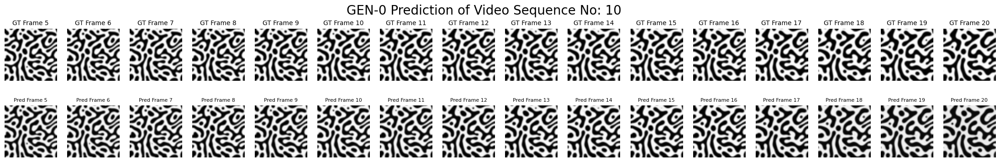

In [43]:
vs = 10 # Video frame to look for visualtization

fig, axes = plt.subplots(2, 16, figsize=(28, 4))
fig.suptitle(f"GEN-0 Prediction of Video Sequence No: {vs}" , fontsize=20)
for idx, ax in enumerate(axes[0]):
    ax.imshow(np.squeeze(GT_array[vs:vs+1, idx:idx+1,:,:,:]), cmap="gray")
    ax.set_title(f"GT Frame {idx + 5}", size=10)
    ax.axis("off")

for idx, ax in enumerate(axes[1]):
    ax.imshow(np.squeeze(PD_array[vs:vs+1, idx:idx+1,:,:,:]), cmap="gray")
    ax.set_title(f"Pred Frame {idx + 5}", size=8)
    ax.axis("off")
plt.show()

### GEN-1 Prediction

In [24]:
X_g1 = PD_array
X_g1 = np.delete(X_g1, -1, axis=1)
y_g1 = np.delete(GT_array, 0, axis=1)
y_g1.shape, X_g1.shape

((363, 18, 64, 64, 1), (363, 18, 64, 64, 1))

In [25]:
a, b, c, d, e = y_g1.shape[0], y_g1.shape[1], y_g1.shape[2], y_g1.shape[3], y_g1.shape[4] 
PD_G1 = np.zeros((a, b, c, d, e))   ## Predicted arrays

for i in range(X_g1.shape[0]):
    frames = X_g1[i]   ## taking 1 validation video sample at one time
    PD_G1[i] = model_1.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

y_g1.shape, PD_G1.shape

((363, 18, 64, 64, 1), (363, 18, 64, 64, 1))

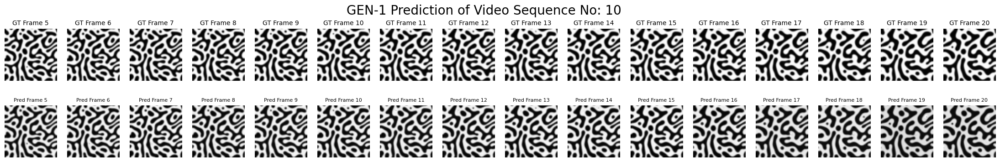

In [44]:
vs = 10 # Video frame to look for visualtization

fig, axes = plt.subplots(2, 16, figsize=(28, 4))
fig.suptitle(f"GEN-1 Prediction of Video Sequence No: {vs}" , fontsize=20)
for idx, ax in enumerate(axes[0]):
    ax.imshow(np.squeeze(y_g1[vs:vs+1, idx:idx+1,:,:,:]), cmap="gray")
    ax.set_title(f"GT Frame {idx + 5}", size=10)
    ax.axis("off")

for idx, ax in enumerate(axes[1]):
    ax.imshow(np.squeeze(PD_G1[vs:vs+1, idx:idx+1,:,:,:]), cmap="gray")
    ax.set_title(f"Pred Frame {idx + 5}", size=8)
    ax.axis("off")
plt.show()

### GEN-2 Prediction

In [26]:
X_g2 = PD_G1
X_g2 = np.delete(X_g2, -1, axis=1)
y_g2 = np.delete(y_g1, 0, axis=1)

X_g2.shape, y_g2.shape

((363, 17, 64, 64, 1), (363, 17, 64, 64, 1))

In [27]:
a, b, c, d, e = y_g2.shape[0], y_g2.shape[1], y_g2.shape[2], y_g2.shape[3], y_g2.shape[4] 
PD_G2 = np.zeros((a, b, c, d, e))   ## Predicted arrays

for i in range(X_g1.shape[0]):
    frames = X_g2[i]   ## taking 1 validation video sample at one time
    PD_G2[i] = model_1.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

y_g2.shape, PD_G2.shape

((363, 17, 64, 64, 1), (363, 17, 64, 64, 1))

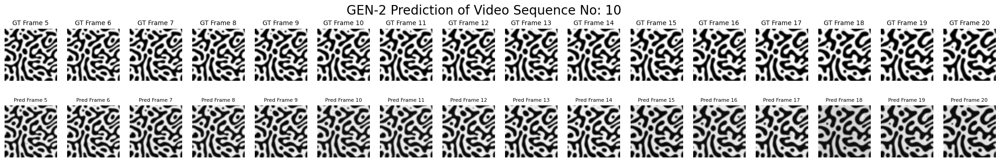

In [45]:
vs = 10 # Video frame to look for visualtization

fig, axes = plt.subplots(2, 16, figsize=(28, 4))
fig.suptitle(f"GEN-2 Prediction of Video Sequence No: {vs}" , fontsize=20)
for idx, ax in enumerate(axes[0]):
    ax.imshow(np.squeeze(y_g2[vs:vs+1, idx:idx+1,:,:,:]), cmap="gray")
    ax.set_title(f"GT Frame {idx + 5}", size=10)
    ax.axis("off")

for idx, ax in enumerate(axes[1]):
    ax.imshow(np.squeeze(PD_G2[vs:vs+1, idx:idx+1,:,:,:]), cmap="gray")
    ax.set_title(f"Pred Frame {idx + 5}", size=8)
    ax.axis("off")
plt.show()

### GEN-3 Prediction

In [28]:
X_g3 = PD_G2
X_g3 = np.delete(X_g3, -1, axis=1)
y_g3 = np.delete(y_g2, 0, axis=1)
X_g3.shape, y_g3.shape

((363, 16, 64, 64, 1), (363, 16, 64, 64, 1))

In [30]:
a, b, c, d, e = y_g3.shape[0], y_g3.shape[1], y_g3.shape[2], y_g3.shape[3], y_g3.shape[4] 
PD_G3 = np.zeros((a, b, c, d, e))   ## Predicted arrays

for i in range(X_g2.shape[0]):
    frames = X_g3[i]   ## taking 1 validation video sample at one time
    PD_G3[i] = model_1.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

y_g3.shape, PD_G3.shape

((363, 16, 64, 64, 1), (363, 16, 64, 64, 1))

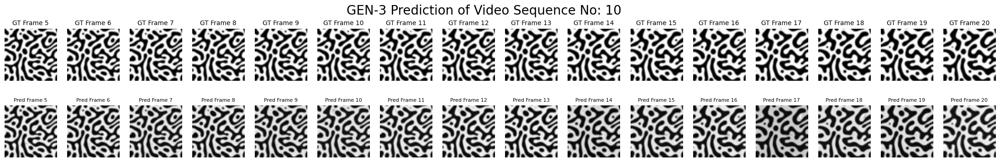

In [46]:
vs = 10 # Video frame to look for visualtization

fig, axes = plt.subplots(2, 16, figsize=(28, 4))
fig.suptitle(f"GEN-3 Prediction of Video Sequence No: {vs}" , fontsize=20)
for idx, ax in enumerate(axes[0]):
    ax.imshow(np.squeeze(y_g3[vs:vs+1, idx:idx+1,:,:,:]), cmap="gray")
    ax.set_title(f"GT Frame {idx + 5}", size=10)
    ax.axis("off")

for idx, ax in enumerate(axes[1]):
    ax.imshow(np.squeeze(PD_G3[vs:vs+1, idx:idx+1,:,:,:]), cmap="gray")
    ax.set_title(f"Pred Frame {idx + 5}", size=8)
    ax.axis("off")
plt.show()

### Saving Predicted outcome

In [31]:
np.save(path+'/Step_3_predictions/model_1_results/GEN-0.npy', [GT_array, PD_array])
np.save(path+'/Step_3_predictions/model_1_results/GEN-1.npy', [y_g1, PD_G1])
np.save(path+'/Step_3_predictions/model_1_results/GEN-2.npy', [y_g2, PD_G2])
np.save(path+'/Step_3_predictions/model_1_results/GEN-3.npy', [y_g3, PD_G3])

## Visualization of Predicted Outcome

# Model  Architecture 2 Predictions

In [3]:
X_test_M2 = np.load(path+'/Step_1_train_test_data/X_y_feature_label/model_2/X_test_M2.npy')
y_test_M2 = np.load (path+'/Step_1_train_test_data/X_y_feature_label/model_2/y_test_M2.npy')

X_test_M2.shape, y_test_M2.shape

((363, 17, 64, 64, 3), (363, 17, 64, 64, 1))

In [4]:
model_2 = load_model(path+'/Step_2_model_development/model_2/trained_model_2.h5')
history_2 = np.load(path+'/Step_2_model_development/model_2/trained_model_2_history.npy', allow_pickle=True).item()

In [6]:
model_2.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, 64, 64, 3)  0         
                             ]                                   
                                                                 
 conv_lstm2d (ConvLSTM2D)    (None, None, 64, 64, 64)  429056    
                                                                 
 batch_normalization (BatchN  (None, None, 64, 64, 64)  256      
 ormalization)                                                   
                                                                 
 conv_lstm2d_1 (ConvLSTM2D)  (None, None, 64, 64, 32)  110720    
                                                                 
 batch_normalization_1 (Batc  (None, None, 64, 64, 32)  128      
 hNormalization)                                                 
                                                             

In [7]:
### Function to scaling the predicted image in grayscale range ### 
def scale_array(arr):
    arr_min = np.min(arr)  ## Flattens the array and finds the min value inside it
    arr_max = np.max(arr)  ## Flattens the array and finds the max value inside it
    scaled_array = (arr - arr_min) / (arr_max - arr_min) * 255
    scaled_array = scaled_array.astype(np.uint8)
    
    return scaled_array

### GEN-0 Prediction

In [47]:
GT_array = y_test_M2
a, b, c, d, e = y_test_M2.shape[0], y_test_M2.shape[1], y_test_M2.shape[2], y_test_M2.shape[3], y_test_M2.shape[4] 
PD_array = np.zeros((a, b, c, d, e))   ## Predicted arrays

for i in range(X_test_M2.shape[0]):
    frames = X_test_M2[i]   ## taking 1 validation video sample at one time
    PD_array[i] = model_2.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

GT_scaled = scale_array(y_test_M2)
PD_scaled = scale_array(PD_array)

GT_array.shape, PD_array.shape

((363, 17, 64, 64, 1), (363, 17, 64, 64, 1))

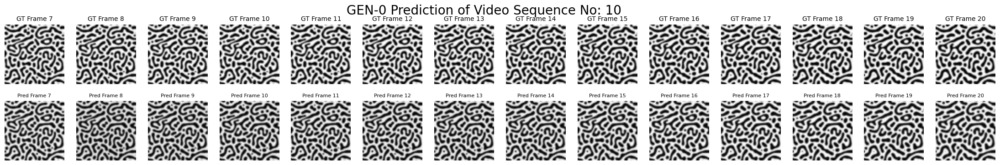

In [52]:
vs = 10 # Video frame to look for visualtization

fig, axes = plt.subplots(2, 14, figsize=(28, 4))
fig.suptitle(f"GEN-0 Prediction of Video Sequence No: {vs}" , fontsize=20)
for idx, ax in enumerate(axes[0]):
    ax.imshow(np.squeeze(GT_array[vs:vs+1, idx:idx+1,:,:,:]), cmap="gray")
    ax.set_title(f"GT Frame {idx + 7}", size=10)
    ax.axis("off")

for idx, ax in enumerate(axes[1]):
    ax.imshow(np.squeeze(PD_array[vs:vs+1, idx:idx+1,:,:,:]), cmap="gray")
    ax.set_title(f"Pred Frame {idx + 7}", size=8)
    ax.axis("off")
plt.show()

### GEN-1 Prediction

In [51]:
X_g1 = np.delete(np.concatenate((X_test_M2, PD_array), axis=-1), 0, axis=-1)
X_g1 = np.delete(X_g1, -1, axis=1)
y_g1 = np.delete(y_test_M2, 0, axis=1)

a, b, c, d, e = y_g1.shape[0], y_g1.shape[1], y_g1.shape[2], y_g1.shape[3], y_g1.shape[4] 
PD_G1 = np.zeros((a, b, c, d, e))   ## Predicted arrays
for i in range(X_g1.shape[0]):
    frames = X_g1[i]   ## taking 1 validation video sample at one time
    PD_G1[i] = model_2.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

y_g1_scaled = scale_array(y_g1)
PD_G1_scaled = scale_array(PD_G1)

y_g1.shape, PD_G1.shape

((363, 16, 64, 64, 1), (363, 16, 64, 64, 1))

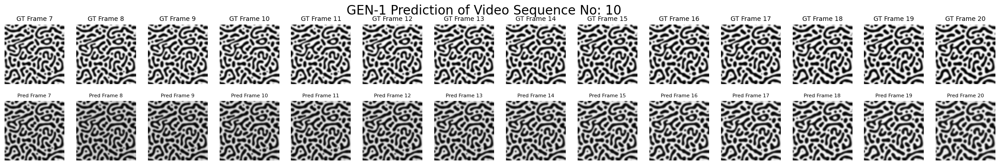

In [53]:
vs = 10 # Video frame to look for visualtization

fig, axes = plt.subplots(2, 14, figsize=(28, 4))
fig.suptitle(f"GEN-1 Prediction of Video Sequence No: {vs}" , fontsize=20)
for idx, ax in enumerate(axes[0]):
    ax.imshow(np.squeeze(y_g1[vs:vs+1, idx:idx+1,:,:,:]), cmap="gray")
    ax.set_title(f"GT Frame {idx + 7}", size=10)
    ax.axis("off")

for idx, ax in enumerate(axes[1]):
    ax.imshow(np.squeeze(PD_G1[vs:vs+1, idx:idx+1,:,:,:]), cmap="gray")
    ax.set_title(f"Pred Frame {idx + 7}", size=8)
    ax.axis("off")
plt.show()

### GEN-2 Prediction

In [60]:
X_g2 = np.delete(np.concatenate((X_g1, PD_G1), axis=-1), 0, axis=-1)
X_g2 = np.delete(X_g2, -1, axis=1)
y_g2 = np.delete(y_g1, 0, axis=1)

a, b, c, d, e = y_g2.shape[0], y_g2.shape[1], y_g2.shape[2], y_g2.shape[3], y_g2.shape[4] 
PD_G2 = np.zeros((a, b, c, d, e))   ## Predicted arrays

for i in range(X_g1.shape[0]):
    frames = X_g2[i]   ## taking 1 validation video sample at one time
    PD_G2[i] = model_2.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

y_g2_scaled = scale_array(y_g2)
PD_G2_scaled = scale_array(PD_G2)

y_g2.shape, PD_G2.shape

((363, 15, 64, 64, 1), (363, 15, 64, 64, 1))

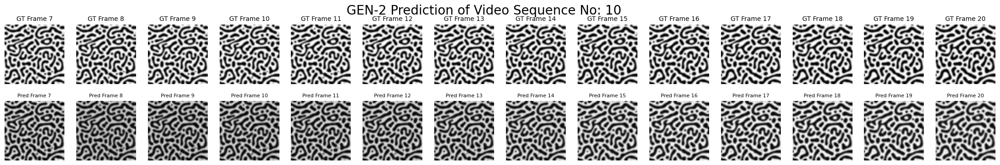

In [61]:
vs = 10 # Video frame to look for visualtization

fig, axes = plt.subplots(2, 14, figsize=(28, 4))
fig.suptitle(f"GEN-2 Prediction of Video Sequence No: {vs}" , fontsize=20)
for idx, ax in enumerate(axes[0]):
    ax.imshow(np.squeeze(y_g2[vs:vs+1, idx:idx+1,:,:,:]), cmap="gray")
    ax.set_title(f"GT Frame {idx + 7}", size=10)
    ax.axis("off")

for idx, ax in enumerate(axes[1]):
    ax.imshow(np.squeeze(PD_G2[vs:vs+1, idx:idx+1,:,:,:]), cmap="gray")
    ax.set_title(f"Pred Frame {idx + 7}", size=8)
    ax.axis("off")
plt.show()

### GEN-3 Prediction

In [62]:
X_g3 = np.delete(np.concatenate((X_g2, PD_G2), axis=-1), 0, axis=-1)
X_g3 = np.delete(X_g3, -1, axis=1)
y_g3 = np.delete(y_g2, 0, axis=1)

a, b, c, d, e = y_g3.shape[0], y_g3.shape[1], y_g3.shape[2], y_g3.shape[3], y_g3.shape[4] 
PD_G3 = np.zeros((a, b, c, d, e))   ## Predicted arrays

for i in range(X_g2.shape[0]):
    frames = X_g3[i]   ## taking 1 validation video sample at one time
    PD_G3[i] = model_2.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

y_g3_scaled = scale_array(y_g3)
PD_G3_scaled = scale_array(PD_G3)

y_g3.shape, PD_G3.shape

((363, 14, 64, 64, 1), (363, 14, 64, 64, 1))

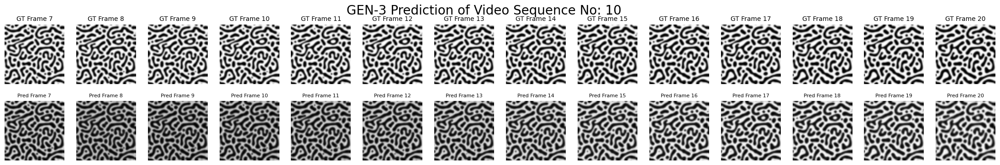

In [63]:
vs = 10 # Video frame to look for visualtization

fig, axes = plt.subplots(2, 14, figsize=(28, 4))
fig.suptitle(f"GEN-3 Prediction of Video Sequence No: {vs}" , fontsize=20)
for idx, ax in enumerate(axes[0]):
    ax.imshow(np.squeeze(y_g3[vs:vs+1, idx:idx+1,:,:,:]), cmap="gray")
    ax.set_title(f"GT Frame {idx + 7}", size=10)
    ax.axis("off")

for idx, ax in enumerate(axes[1]):
    ax.imshow(np.squeeze(PD_G3[vs:vs+1, idx:idx+1,:,:,:]), cmap="gray")
    ax.set_title(f"Pred Frame {idx + 7}", size=8)
    ax.axis("off")
plt.show()

### GEN-4 Prediction

In [11]:
X_g4 = np.delete(np.concatenate((X_g3, PD_G3), axis=-1), 0, axis=-1)
X_g4 = np.delete(X_g4, -1, axis=1)
y_g4 = np.delete(y_g3, 0, axis=1)

a, b, c, d, e = y_g4.shape[0], y_g4.shape[1], y_g4.shape[2], y_g4.shape[3], y_g4.shape[4] 
PD_G4 = np.zeros((a, b, c, d, e))   ## Predicted arrays

for i in range(X_g3.shape[0]):
    frames = X_g4[i]   ## taking 1 validation video sample at one time
    PD_G4[i] = model_2.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

y_g4_scaled = scale_array(y_g4)
PD_G4_scaled = scale_array(PD_G4)

y_g4.shape, PD_G4.shape

((11, 13, 64, 64, 1), (11, 13, 64, 64, 1))

### GEN-5 Prediction

In [12]:
X_g5 = np.delete(np.concatenate((X_g4, PD_G4), axis=-1), 0, axis=-1)
X_g5 = np.delete(X_g5, -1, axis=1)
y_g5 = np.delete(y_g4, 0, axis=1)

a, b, c, d, e = y_g5.shape[0], y_g5.shape[1], y_g5.shape[2], y_g5.shape[3], y_g5.shape[4] 
PD_G5 = np.zeros((a, b, c, d, e))   ## Predicted arrays

for i in range(X_g4.shape[0]):
    frames = X_g5[i]   ## taking 1 validation video sample at one time
    PD_G5[i] = model_2.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

y_g5_scaled = scale_array(y_g5)
PD_G5_scaled = scale_array(PD_G5)

y_g5.shape, PD_G5.shape

((11, 12, 64, 64, 1), (11, 12, 64, 64, 1))

### GEN-6 Prediction

In [13]:
X_g6 = np.delete(np.concatenate((X_g5, PD_G5), axis=-1), 0, axis=-1)
X_g6 = np.delete(X_g6, -1, axis=1)
y_g6 = np.delete(y_g5, 0, axis=1)

a, b, c, d, e = y_g6.shape[0], y_g6.shape[1], y_g6.shape[2], y_g6.shape[3], y_g6.shape[4] 
PD_G6 = np.zeros((a, b, c, d, e))   ## Predicted arrays

for i in range(X_g5.shape[0]):
    frames = X_g6[i]   ## taking 1 validation video sample at one time
    PD_G6[i] = model_2.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

y_g6_scaled = scale_array(y_g6)
PD_G6_scaled = scale_array(PD_G6)

y_g6.shape, PD_G6.shape

((11, 11, 64, 64, 1), (11, 11, 64, 64, 1))

### GEN-7 Prediction

In [14]:
X_g7 = np.delete(np.concatenate((X_g6, PD_G6), axis=-1), 0, axis=-1)
X_g7 = np.delete(X_g7, -1, axis=1)
y_g7 = np.delete(y_g6, 0, axis=1)

a, b, c, d, e = y_g7.shape[0], y_g7.shape[1], y_g7.shape[2], y_g7.shape[3], y_g7.shape[4] 
PD_G7 = np.zeros((a, b, c, d, e))   ## Predicted arrays

for i in range(X_g6.shape[0]):
    frames = X_g7[i]   ## taking 1 validation video sample at one time
    PD_G7[i] = model_2.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

y_g7_scaled = scale_array(y_g7)
PD_G7_scaled = scale_array(PD_G7)

y_g7.shape, PD_G7.shape

((11, 10, 64, 64, 1), (11, 10, 64, 64, 1))

### GEN-8 Prediction

In [15]:
X_g8 = np.delete(np.concatenate((X_g7, PD_G7), axis=-1), 0, axis=-1)
X_g8 = np.delete(X_g8, -1, axis=1)
y_g8 = np.delete(y_g7, 0, axis=1)

a, b, c, d, e = y_g8.shape[0], y_g8.shape[1], y_g8.shape[2], y_g8.shape[3], y_g8.shape[4] 
PD_G8 = np.zeros((a, b, c, d, e))   ## Predicted arrays

for i in range(X_g7.shape[0]):
    frames = X_g8[i]   ## taking 1 validation video sample at one time
    PD_G8[i] = model_2.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

y_g8_scaled = scale_array(y_g8)
PD_G8_scaled = scale_array(PD_G8)

y_g8.shape, PD_G8.shape

((11, 9, 64, 64, 1), (11, 9, 64, 64, 1))

### GEN-9 Prediction

In [16]:
X_g9 = np.delete(np.concatenate((X_g8, PD_G8), axis=-1), 0, axis=-1)
X_g9 = np.delete(X_g9, -1, axis=1)
y_g9 = np.delete(y_g8, 0, axis=1)

a, b, c, d, e = y_g9.shape[0], y_g9.shape[1], y_g9.shape[2], y_g9.shape[3], y_g9.shape[4] 
PD_G9 = np.zeros((a, b, c, d, e))   ## Predicted arrays

for i in range(X_g8.shape[0]):
    frames = X_g9[i]   ## taking 1 validation video sample at one time
    PD_G9[i] = model_2.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

y_g9_scaled = scale_array(y_g9)
PD_G9_scaled = scale_array(PD_G9)

y_g9.shape, PD_G9.shape

((11, 8, 64, 64, 1), (11, 8, 64, 64, 1))

### GEN-10 Prediction

In [17]:
X_g10 = np.delete(np.concatenate((X_g9, PD_G9), axis=-1), 0, axis=-1)
X_g10 = np.delete(X_g10, -1, axis=1)
y_g10 = np.delete(y_g9, 0, axis=1)

a, b, c, d, e = y_g10.shape[0], y_g10.shape[1], y_g10.shape[2], y_g10.shape[3], y_g10.shape[4] 
PD_G10 = np.zeros((a, b, c, d, e))   ## Predicted arrays

for i in range(X_g9.shape[0]):
    frames = X_g10[i]   ## taking 1 validation video sample at one time
    PD_G10[i] = model_2.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

y_g10_scaled = scale_array(y_g10)
PD_G10_scaled = scale_array(PD_G10)

y_g10.shape, PD_G10.shape

((11, 7, 64, 64, 1), (11, 7, 64, 64, 1))

### GEN-11 Prediction

In [18]:
X_g11 = np.delete(np.concatenate((X_g10, PD_G10), axis=-1), 0, axis=-1)
X_g11 = np.delete(X_g11, -1, axis=1)
y_g11 = np.delete(y_g10, 0, axis=1)

a, b, c, d, e = y_g11.shape[0], y_g11.shape[1], y_g11.shape[2], y_g11.shape[3], y_g11.shape[4] 
PD_G11 = np.zeros((a, b, c, d, e))   ## Predicted arrays

for i in range(X_g10.shape[0]):
    frames = X_g11[i]   ## taking 1 validation video sample at one time
    PD_G11[i] = model_2.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

y_g11_scaled = scale_array(y_g11)
PD_G11_scaled = scale_array(PD_G11)

y_g11.shape, PD_G11.shape

((11, 6, 64, 64, 1), (11, 6, 64, 64, 1))

### GEN-12 Prediction

In [19]:
X_g12 = np.delete(np.concatenate((X_g11, PD_G11), axis=-1), 0, axis=-1)
X_g12 = np.delete(X_g12, -1, axis=1)
y_g12 = np.delete(y_g11, 0, axis=1)

a, b, c, d, e = y_g12.shape[0], y_g12.shape[1], y_g12.shape[2], y_g12.shape[3], y_g12.shape[4] 
PD_G12 = np.zeros((a, b, c, d, e))   ## Predicted arrays

for i in range(X_g11.shape[0]):
    frames = X_g12[i]   ## taking 1 validation video sample at one time
    PD_G12[i] = model_2.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

y_g12_scaled = scale_array(y_g12)
PD_G12_scaled = scale_array(PD_G12)

y_g12.shape, PD_G12.shape

((11, 5, 64, 64, 1), (11, 5, 64, 64, 1))

### GEN-13 Prediction

In [20]:
X_g13 = np.delete(np.concatenate((X_g12, PD_G12), axis=-1), 0, axis=-1)
X_g13 = np.delete(X_g13, -1, axis=1)
y_g13 = np.delete(y_g12, 0, axis=1)

a, b, c, d, e = y_g13.shape[0], y_g13.shape[1], y_g13.shape[2], y_g13.shape[3], y_g13.shape[4] 
PD_G13 = np.zeros((a, b, c, d, e))   ## Predicted arrays

for i in range(X_g12.shape[0]):
    frames = X_g13[i]   ## taking 1 validation video sample at one time
    PD_G13[i] = model_2.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

y_g13_scaled = scale_array(y_g13)
PD_G13_scaled = scale_array(PD_G13)

y_g13.shape, PD_G13.shape

((11, 4, 64, 64, 1), (11, 4, 64, 64, 1))

### GEN-14 Prediction

In [21]:
X_g14 = np.delete(np.concatenate((X_g13, PD_G13), axis=-1), 0, axis=-1)
X_g14 = np.delete(X_g14, -1, axis=1)
y_g14 = np.delete(y_g13, 0, axis=1)

a, b, c, d, e = y_g14.shape[0], y_g14.shape[1], y_g14.shape[2], y_g14.shape[3], y_g14.shape[4] 
PD_G14 = np.zeros((a, b, c, d, e))   ## Predicted arrays

for i in range(X_g13.shape[0]):
    frames = X_g14[i]   ## taking 1 validation video sample at one time
    PD_G14[i] = model_2.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

y_g14_scaled = scale_array(y_g14)
PD_G14_scaled = scale_array(PD_G14)

y_g14.shape, PD_G14.shape

((11, 3, 64, 64, 1), (11, 3, 64, 64, 1))

### GEN-15 Prediction

In [22]:
X_g15 = np.delete(np.concatenate((X_g14, PD_G14), axis=-1), 0, axis=-1)
X_g15 = np.delete(X_g15, -1, axis=1)
y_g15 = np.delete(y_g14, 0, axis=1)

a, b, c, d, e = y_g15.shape[0], y_g15.shape[1], y_g15.shape[2], y_g15.shape[3], y_g15.shape[4] 
PD_G15 = np.zeros((a, b, c, d, e))   ## Predicted arrays

for i in range(X_g14.shape[0]):
    frames = X_g15[i]   ## taking 1 validation video sample at one time
    PD_G15[i] = model_2.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

y_g15_scaled = scale_array(y_g15)
PD_G15_scaled = scale_array(PD_G15)

y_g15.shape, PD_G15.shape

((11, 2, 64, 64, 1), (11, 2, 64, 64, 1))

### GEN-16 Prediction

In [23]:
X_g16 = np.delete(np.concatenate((X_g15, PD_G15), axis=-1), 0, axis=-1)
X_g16 = np.delete(X_g16, -1, axis=1)
y_g16 = np.delete(y_g15, 0, axis=1)

a, b, c, d, e = y_g16.shape[0], y_g16.shape[1], y_g16.shape[2], y_g16.shape[3], y_g16.shape[4] 
PD_G16 = np.zeros((a, b, c, d, e))   ## Predicted arrays

for i in range(X_g15.shape[0]):
    frames = X_g16[i]   ## taking 1 validation video sample at one time
    PD_G16[i] = model_2.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

y_g16_scaled = scale_array(y_g16)
PD_G16_scaled = scale_array(PD_G16)

y_g16.shape, PD_G16.shape

((11, 1, 64, 64, 1), (11, 1, 64, 64, 1))

### Saving predicted outcome

In [16]:
np.save(path+'/Step_3_predictions/model_2_results/GEN-0.npy', [GT_array, PD_array])
np.save(path+'/Step_3_predictions/model_2_results/GEN-1.npy', [y_g1, PD_G1])
np.save(path+'/Step_3_predictions/model_2_results/GEN-2.npy', [y_g2, PD_G2])
np.save(path+'/Step_3_predictions/model_2_results/GEN-3.npy', [y_g3, PD_G3])

np.save(path+'/Step_3_predictions/model_2_results/GEN-4.npy', [y_g4, PD_G4])
np.save(path+'/Step_3_predictions/model_2_results/GEN-5.npy', [y_g5, PD_G5])
np.save(path+'/Step_3_predictions/model_2_results/GEN-6.npy', [y_g6, PD_G6])
np.save(path+'/Step_3_predictions/model_2_results/GEN-7.npy', [y_g7, PD_G7])
np.save(path+'/Step_3_predictions/model_2_results/GEN-8.npy', [y_g8, PD_G8])
np.save(path+'/Step_3_predictions/model_2_results/GEN-9.npy', [y_g9, PD_G9])
np.save(path+'/Step_3_predictions/model_2_results/GEN-10.npy', [y_g10, PD_G10])
np.save(path+'/Step_3_predictions/model_2_results/GEN-11.npy', [y_g11, PD_G11])
np.save(path+'/Step_3_predictions/model_2_results/GEN-12.npy', [y_g12, PD_G12])
np.save(path+'/Step_3_predictions/model_2_results/GEN-13.npy', [y_g13, PD_G13])
np.save(path+'/Step_3_predictions/model_2_results/GEN-14.npy', [y_g14, PD_G14])
np.save(path+'/Step_3_predictions/model_2_results/GEN-15.npy', [y_g15, PD_G15])
np.save(path+'/Step_3_predictions/model_2_results/GEN-16.npy', [y_g16, PD_G16])

# Model  Architecture 3 Predictions

In [6]:
X_test_M3 = np.load(path+'/Step_1_train_test_data/X_y_feature_label/model_3/X_test_M3.npy')
y_test_M3 = np.load (path+'/Step_1_train_test_data/X_y_feature_label/model_3/y_test_M3.npy')

X_test_M3 = X_test_M3[:137,:,:,:,:]
y_test_M3 = y_test_M3[:137,:,:,:,:]

X_test_M3.shape, y_test_M3.shape

((137, 15, 64, 64, 5), (137, 15, 64, 64, 1))

In [7]:
model_3 = load_model(path+'/Step_2_model_development/model_3/trained_model_3.h5')
history_3 = np.load(path+'/Step_2_model_development/model_3/trained_model_3_history.npy', allow_pickle=True).item()

In [8]:
model_3.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d (ConvLSTM2D)    (None, None, 64, 64, 64   441856    
                             )                                   
                                                                 
 batch_normalization (Batch  (None, None, 64, 64, 64   256       
 Normalization)              )                                   
                                                                 
 conv_lstm2d_1 (ConvLSTM2D)  (None, None, 64, 64, 32   110720    
                             )                                   
                                                                 
 batch_normalization_1 (Bat  (None, None, 64, 64, 32   128       
 chNormalization)            )                                   
                                                                 
 conv_lstm2d_2 (ConvLSTM2D)  (None, None, 64, 64, 16   3

In [9]:
### Function to scaling the predicted image in grayscale range ### 
def scale_array(arr):
    arr_min = np.min(arr)  ## Flattens the array and finds the min value inside it
    arr_max = np.max(arr)  ## Flattens the array and finds the max value inside it
    scaled_array = (arr - arr_min) / (arr_max - arr_min) * 255
    scaled_array = scaled_array.astype(np.uint8)
    
    return scaled_array

### GEN-0 Prediction

In [10]:
GT_array = y_test_M3
a, b, c, d, e = y_test_M3.shape[0], y_test_M3.shape[1], y_test_M3.shape[2], y_test_M3.shape[3], y_test_M3.shape[4] 
PD_array = np.zeros((a, b, c, d, e))   ## Predicted arrays

for i in range(X_test_M3.shape[0]):
    frames = X_test_M3[i]   ## taking 1 validation video sample at one time
    PD_array[i] = model_3.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

GT_scaled = scale_array(y_test_M3)
PD_scaled = scale_array(PD_array)

GT_array.shape, PD_array.shape

((137, 15, 64, 64, 1), (137, 15, 64, 64, 1))

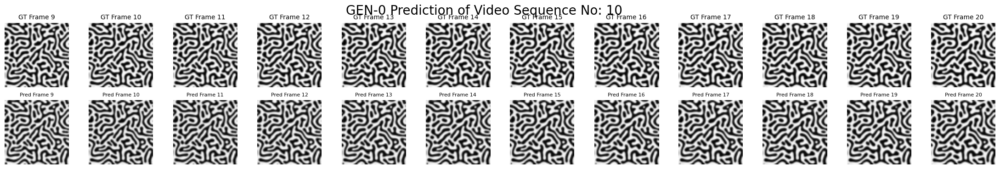

In [11]:
vs = 10 # Video frame to look for visualtization

fig, axes = plt.subplots(2, 12, figsize=(28, 4))
fig.suptitle(f"GEN-0 Prediction of Video Sequence No: {vs}" , fontsize=20)
for idx, ax in enumerate(axes[0]):
    ax.imshow(np.squeeze(GT_array[vs:vs+1, idx:idx+1,:,:,:]), cmap="gray")
    ax.set_title(f"GT Frame {idx + 9}", size=10)
    ax.axis("off")

for idx, ax in enumerate(axes[1]):
    ax.imshow(np.squeeze(PD_array[vs:vs+1, idx:idx+1,:,:,:]), cmap="gray")
    ax.set_title(f"Pred Frame {idx + 9}", size=8)
    ax.axis("off")
plt.show()

### GEN-1 Prediction

In [12]:
X_g1 = np.delete(np.concatenate((X_test_M3, PD_array), axis=-1), 0, axis=-1)
X_g1 = np.delete(X_g1, -1, axis=1)
y_g1 = np.delete(y_test_M3, 0, axis=1)

a, b, c, d, e = y_g1.shape[0], y_g1.shape[1], y_g1.shape[2], y_g1.shape[3], y_g1.shape[4] 
PD_G1 = np.zeros((a, b, c, d, e))   ## Predicted arrays
for i in range(X_g1.shape[0]):
    frames = X_g1[i]   ## taking 1 validation video sample at one time
    PD_G1[i] = model_3.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

y_g1_scaled = scale_array(y_g1)
PD_G1_scaled = scale_array(PD_G1)

y_g1.shape, PD_G1.shape

((137, 14, 64, 64, 1), (137, 14, 64, 64, 1))

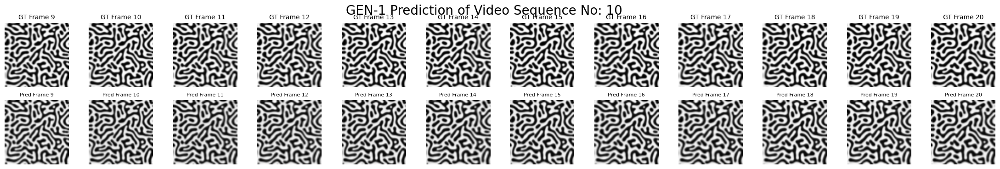

In [13]:
vs = 10 # Video frame to look for visualtization

fig, axes = plt.subplots(2, 12, figsize=(28, 4))
fig.suptitle(f"GEN-1 Prediction of Video Sequence No: {vs}" , fontsize=20)
for idx, ax in enumerate(axes[0]):
    ax.imshow(np.squeeze(y_g1[vs:vs+1, idx:idx+1,:,:,:]), cmap="gray")
    ax.set_title(f"GT Frame {idx + 9}", size=10)
    ax.axis("off")

for idx, ax in enumerate(axes[1]):
    ax.imshow(np.squeeze(PD_G1[vs:vs+1, idx:idx+1,:,:,:]), cmap="gray")
    ax.set_title(f"Pred Frame {idx + 9}", size=8)
    ax.axis("off")
plt.show()

### GEN-2 Prediction

In [14]:
X_g2 = np.delete(np.concatenate((X_g1, PD_G1), axis=-1), 0, axis=-1)
X_g2 = np.delete(X_g2, -1, axis=1)
y_g2 = np.delete(y_g1, 0, axis=1)

a, b, c, d, e = y_g2.shape[0], y_g2.shape[1], y_g2.shape[2], y_g2.shape[3], y_g2.shape[4] 
PD_G2 = np.zeros((a, b, c, d, e))   ## Predicted arrays

for i in range(X_g1.shape[0]):
    frames = X_g2[i]   ## taking 1 validation video sample at one time
    PD_G2[i] = model_3.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

y_g2_scaled = scale_array(y_g2)
PD_G2_scaled = scale_array(PD_G2)

y_g2.shape, PD_G2.shape

((137, 13, 64, 64, 1), (137, 13, 64, 64, 1))

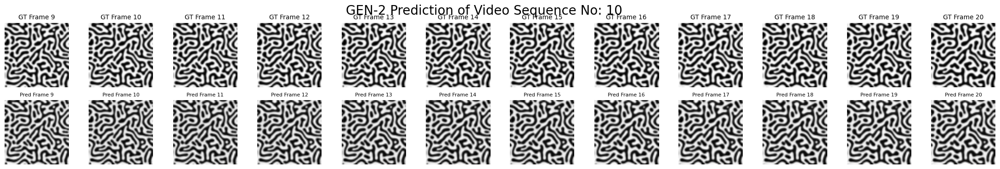

In [15]:
vs = 10 # Video frame to look for visualtization

fig, axes = plt.subplots(2, 12, figsize=(28, 4))
fig.suptitle(f"GEN-2 Prediction of Video Sequence No: {vs}" , fontsize=20)
for idx, ax in enumerate(axes[0]):
    ax.imshow(np.squeeze(y_g2[vs:vs+1, idx:idx+1,:,:,:]), cmap="gray")
    ax.set_title(f"GT Frame {idx + 9}", size=10)
    ax.axis("off")

for idx, ax in enumerate(axes[1]):
    ax.imshow(np.squeeze(PD_G2[vs:vs+1, idx:idx+1,:,:,:]), cmap="gray")
    ax.set_title(f"Pred Frame {idx + 9}", size=8)
    ax.axis("off")
plt.show()

### GEN-3 Prediction

In [16]:
X_g3 = np.delete(np.concatenate((X_g2, PD_G2), axis=-1), 0, axis=-1)
X_g3 = np.delete(X_g3, -1, axis=1)
y_g3 = np.delete(y_g2, 0, axis=1)

a, b, c, d, e = y_g3.shape[0], y_g3.shape[1], y_g3.shape[2], y_g3.shape[3], y_g3.shape[4] 
PD_G3 = np.zeros((a, b, c, d, e))   ## Predicted arrays

for i in range(X_g2.shape[0]):
    frames = X_g3[i]   ## taking 1 validation video sample at one time
    PD_G3[i] = model_3.predict(np.expand_dims(frames, axis=0), verbose=0, workers=10, use_multiprocessing=True)

y_g3_scaled = scale_array(y_g3)
PD_G3_scaled = scale_array(PD_G3)

y_g3.shape, PD_G3.shape

((137, 12, 64, 64, 1), (137, 12, 64, 64, 1))

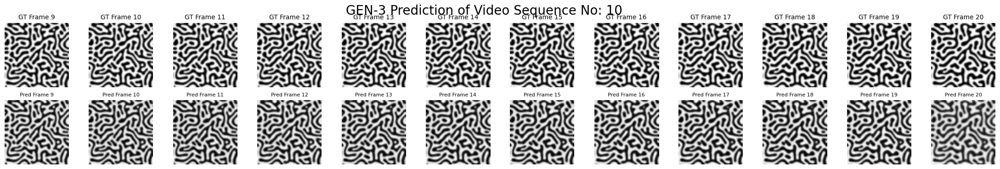

In [17]:
vs = 10 # Video frame to look for visualtization

fig, axes = plt.subplots(2, 12, figsize=(28, 4))
fig.suptitle(f"GEN-3 Prediction of Video Sequence No: {vs}" , fontsize=20)
for idx, ax in enumerate(axes[0]):
    ax.imshow(np.squeeze(y_g3[vs:vs+1, idx:idx+1,:,:,:]), cmap="gray")
    ax.set_title(f"GT Frame {idx + 9}", size=10)
    ax.axis("off")

for idx, ax in enumerate(axes[1]):
    ax.imshow(np.squeeze(PD_G3[vs:vs+1, idx:idx+1,:,:,:]), cmap="gray")
    ax.set_title(f"Pred Frame {idx + 9}", size=8)
    ax.axis("off")
plt.show()

### Saving predicted outcome

In [18]:
np.save(path+'/Step_3_predictions/model_3_results/GEN-0.npy', [GT_array, PD_array])
np.save(path+'/Step_3_predictions/model_3_results/GEN-1.npy', [y_g1, PD_G1])
np.save(path+'/Step_3_predictions/model_3_results/GEN-2.npy', [y_g2, PD_G2])
np.save(path+'/Step_3_predictions/model_3_results/GEN-3.npy', [y_g3, PD_G3])